In [1]:
import numpy as np 
import os 
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import plotly.graph_objects as go
from scipy.interpolate import griddata
from utils.antenna import *
from plotly.subplots import make_subplots
import plotly.io as pio


import pyvista as pv 

In [11]:

class Antenna:

    def __init__(self) -> None:
        self.phi = []
        self.theta = []
        self.gain_total = []
        self.gain_total_db = []
        self.gain_theta = []
        self.gain_theta_db = []
        self.gain_phi = []
        self.gain_phi_db = []

        self.df = pd.DataFrame(columns=['phi', 'theta', 'gain_total', 'gain_total_db',
                               'gain_theta', 'gain_theta_db', 'gain_phi', 'gain_phi_db'])

    def _to_cartesian(self, lat, lon, radius=6371):
        # Convert latitude and longitude from degrees to radians
        lat_rad = math.radians(lat)
        lon_rad = math.radians(lon)

        # Calculate Cartesian coordinates
        X = radius * math.cos(lat_rad) * math.cos(lon_rad)
        Y = radius * math.cos(lat_rad) * math.sin(lon_rad)
        Z = radius * math.sin(lat_rad)

        return X, Y, Z

    def llh_to_ecef(self, lat, lon, alt):
        # WGS84 ellipsoid constants
        a = 6378137  # semi-major axis in meters
        f = 1 / 298.257223563  # flattening
        e_sq = f * (1 - f) **2  # square of eccentricity

        # Convert latitude and longitude to radians
        lat_rad = math.radians(lat)
        lon_rad = math.radians(lon)

        # Calculate the radius of curvature in the prime vertical
        N = a / math.sqrt(1 - e_sq * math.sin(lat_rad)**2)

        # Calculate Cartesian coordinates
        X = (N + alt) * math.cos(lat_rad) * math.cos(lon_rad)
        Y = (N + alt) * math.cos(lat_rad) * math.sin(lon_rad)
        Z = (N * (1 - e_sq) + alt) * math.sin(lat_rad)

        return X, Y, Z

    def get_elevation_angle(self, lat1, lon1, lat2, lon2, h1, h2):
        # Calculate the elevation angle between two points
        # lat1, lon1: coordinates of the first point
        # lat2, lon2: coordinates of the second point
        # h1, h2: height of the first and second point
        # Returns the elevation angle in radians
        x1, y1, z1 = self.llh_to_ecef(lat1, lon1, h1)
        x2, y2, z2 = self.llh_to_ecef(lat2, lon2, h2)
        d = np.sqrt((x2 - x1)**2 + (y2 - y1)**2)
        h = z2 - z1
        return np.arctan(h/d)

    def get_azimuth_angle(self, lat1, lon1, lat2, lon2):
        # Calculate the azimuth angle between two points
        # lat1, lon1: coordinates of the first point
        # lat2, lon2: coordinates of the second point
        # Returns the azimuth angle in radians
        x1, y1, _ = self.llh_to_ecef(lat1, lon1, 0)
        x2, y2, _ = self.llh_to_ecef(lat2, lon2, 0)

        return np.arctan2(np.abs(y2 - y1), np.abs(x2 - x1))

    def plotPolar(self, slice='elevation', value=np.pi/2, rng=None):
        fig = go.Figure()

        # Horizontal slice (theta = pi/2)
        df_key = 'theta' if slice == 'elevation' else 'phi'
        slice_t = self.df[round(self.df[df_key], 2) == round(value, 2)]
        r_key = 'phi' if slice == 'elevation' else 'theta'

        if slice == 'elevation':
            tmp = self.df[round(self.df[df_key], 2) == round(-value, 2)].copy()
            tmp[r_key] = tmp[r_key] - np.pi
            slice_t = pd.concat([slice_t, tmp])

        fig.add_trace(go.Scatterpolar(
            r=slice_t['gain_total_db'],
            theta=np.rad2deg(slice_t[r_key]),
            mode='lines',
            name='Figure 8',
            line_color='peru'
        ))

        fig.update_layout(
            title='Antenna Pattern - ' +
            str.upper(slice) + ' | ' + df_key + ' = ' +
            str(np.rad2deg(value)) + ' degrees',
            showlegend=False,
            polar=dict(
                radialaxis=dict(range=rng)
            )
        )

        fig.show()

    def plot3d(self):
        theta = np.array(self.df["theta"])
        phi = np.array(self.df["phi"])
        power = np.array(self.df["gain_total_db"])

        phi_grid, theta_grid = np.meshgrid(np.unique(phi), np.unique(theta))

        displacement = max(abs(power.min()), abs(power.max()))
        etotal_grid = griddata(
            (phi, theta), power, (phi_grid, theta_grid), method='linear') + displacement

        x = etotal_grid * np.sin(theta_grid) * np.cos(phi_grid)
        y = etotal_grid * np.sin(theta_grid) * np.sin(phi_grid)
        z = etotal_grid * np.cos(theta_grid)

        fig = go.Figure(data=[go.Surface(
            x=x, y=y, z=z, surfacecolor=etotal_grid-displacement, colorscale='jet')])

        fig.update_layout(
            title='3D Antenna Radiation Pattern',
            scene=dict(
                xaxis_title='X',
                yaxis_title='Y',
                zaxis_title='Z'
            ),
            width=800,
            height=800
        )
        
        fig.update_layout(
            scene = {
                "xaxis": {"visible": False},
                "yaxis": {"visible": False},
                "zaxis": {"visible": False},
                "bgcolor": 'rgba(0,0,0,0)'  # Transparent background
            },
            paper_bgcolor='rgba(0,0,0,0)',  # Transparent paper background
        )

        fig.show()
        fig.write_image("3d_surface_plot.png", scale=3)

    def xyz_radiation(self):
        theta = np.array(self.df["theta"]);
        phi = np.array(self.df["phi"]);
        power = np.array(self.df["gain_total_db"]);
        
        phi_grid, theta_grid = np.meshgrid(np.unique(phi), np.unique(theta))

        displacement = max(abs(power.min()), abs(power.max()))
        etotal_grid = griddata((phi, theta), power, (phi_grid, theta_grid), method='linear') + displacement

        x = etotal_grid * np.sin(theta_grid) * np.cos(phi_grid)
        y = etotal_grid * np.sin(theta_grid) * np.sin(phi_grid)
        z = etotal_grid * np.cos(theta_grid)
        
        return x, y, z, etotal_grid - displacement
        

    def generateStl(self, fname):
        theta = np.array(self.df["theta"])
        phi = np.array(self.df["phi"])
        power = np.array(self.df["gain_total_db"])

        phi_grid, theta_grid = np.meshgrid(np.unique(phi), np.unique(theta))

        displacement = max(abs(power.min()), abs(power.max()))
        etotal_grid = griddata(
            (phi, theta), power, (phi_grid, theta_grid), method='linear') + displacement

        x = etotal_grid * np.sin(theta_grid) * np.cos(phi_grid)
        y = etotal_grid * np.sin(theta_grid) * np.sin(phi_grid)
        z = etotal_grid * np.cos(theta_grid)

        mesh = pv.StructuredGrid(x, y, z)
        surface = mesh.extract_surface()
        triangulated = surface.triangulate()

        p = pv.Plotter()
        p.add_mesh(mesh)
        p.show()

        # pv.save_meshio(f"{fname}.stl",triangulated)
        triangulated.save(f"{fname}.stl")

    def read(self, filename):
        with open(filename, 'r') as file:
            lines = file.readlines()
            for line in lines:
                ln = line.split()
                if len(ln) > 5 and ln[0] != "Phi":
                    self.phi.append(float(ln[0]))
                    self.theta.append(float(ln[1]))
                    self.gain_total_db.append(float(ln[2]))
                    self.gain_phi_db.append(float(ln[3]))
                    self.gain_theta_db.append(float(ln[4]))

        self.phi = np.array(self.phi)
        self.theta = np.array(self.theta)
        self.gain_total_db = np.array(self.gain_total_db)
        self.gain_phi_db = np.array(self.gain_phi_db)
        self.gain_theta_db = np.array(self.gain_theta_db)
        self.gain_total = 10**(self.gain_total_db/10)
        self.gain_phi = 10**(self.gain_phi_db/10)
        self.gain_theta = 10**(self.gain_theta_db/10)

        self.df = pd.DataFrame({'phi': self.phi, 'theta': self.theta, 'gain_total': self.gain_total, 'gain_total_db': self.gain_total_db,
                               'gain_phi': self.gain_phi, 'gain_phi_db': self.gain_phi_db, 'gain_theta': self.gain_theta, 'gain_theta_db': self.gain_theta_db})
        # self.df = pd.DataFrame({'phi': self.phi, 'theta': self.theta, 'gain_total': self.gain, 'gain_total_db': self.gain_db, 'gain_phi': self.gain_phi, 'gain_phi_db': self.gain_phi_db, 'gain_theta': self.gain_theta, 'gain_theta_db': self.gain_theta_db})
        # self.df = pd.DataFrame({'phi': self.phi, 'theta': self.theta, 'gain': self.gain, 'gain_db': self.gain_db})

    def getGain(self, phi, theta):
        # Interpolates the gain from the given phi and theta
        gain = griddata((self.phi, self.theta),
                        self.gain_total_db, (phi, theta), method='nearest')
        return gain

    # Predefined antenna patterns
    def readTxAntenna(self):
        _FNAME = "./Antenna Measurements/RM-WB1-DN-BLK Upside Down/RM-WB1-DN-BLK Upside Down-F3500.txt"  # 3.5 GHz
        self.read(_FNAME)

    def readRxAntenna(self):
        _FNAME = "./Antenna Measurements/SA-1400-5900/SA-1400-5900-F2100.txt"  # 3.5 GHz
        self.read(_FNAME)

In [12]:
def receiverAntennaPattern():
    _FNAME = "./Antenna Measurements/SA-1400-5900/SA-1400-5900-F3500.txt" # 3.5 GHz
    AntennaRX = Antenna()

    AntennaRX.read(_FNAME)
    AntennaRX.plot3d()

    print(AntennaRX.getGain(2, 8))

    return AntennaRX

In [13]:
def transmitterAntennaPattern():
    _FNAME = "./Antenna Measurements/RM-WB1-DN-BLK Upside Down/RM-WB1-DN-BLK Upside Down-F3500.txt" # 3.5 GHz

    AntennaTX = Antenna()
    AntennaTX.read(_FNAME)
    AntennaTX.plot3d()

    print(AntennaTX.getGain(2, 0.7))
    return AntennaTX

In [14]:
receiverAntennaPattern()

-9.35775266326061


In [15]:
transmitterAntennaPattern()

-4.25984671867144


In [8]:
_FNAME = "./Antenna Measurements/SA-1400-5900/SA-1400-5900-F3500.txt" # 3.5 GHz
AntennaRX = Antenna()

AntennaRX.read(_FNAME)

AntennaTX = Antenna()
AntennaTX.readTxAntenna()

In [9]:
AntennaRX = Antenna()
_FNAME = "./Antenna Measurements/SA-1400-5900/SA-1400-5900-F1700.txt" # 3.5 GHz
AntennaRX.read(_FNAME)
AntennaRX.plotPolar(slice='elevation', value=np.pi/2, rng=[-30,0])

In [10]:
AntennaRX = Antenna()
_FNAME = "./Antenna Measurements/SA-1400-5900/SA-1400-5900-F3500.txt" # 1.7 GHz
AntennaRX.read(_FNAME)
AntennaRX.plotPolar(slice='azimuth', value=np.pi/2, rng=[-70,0])

In [11]:
AntennaTX = Antenna()
_FNAME = "./Antenna Measurements/RM-WB1-DN-BLK Upside Down/RM-WB1-DN-BLK Upside Down-F3500.txt" # 3.5 GHz
AntennaTX.read(_FNAME)
AntennaTX.plotPolar(slice='elevation', value=np.pi/2, rng=[-35,10])

In [12]:
AntennaTX = Antenna()
_FNAME = "./Antenna Measurements/RM-WB1-DN-BLK Upside Down/RM-WB1-DN-BLK Upside Down-F3500.txt" # 3.5 GHz
AntennaTX.read(_FNAME)
AntennaTX.plotPolar(slice='azimuth', value=np.pi/2, rng=[-15,5])

/home/agrses/.local/lib/python3.12/site-packages/pyvista/jupyter/notebook.py:34: UserWarning:

Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/home/agrses/.local/lib/python3.12/site-packages/trame/widgets/__init__.py)

Falling back to a static output.



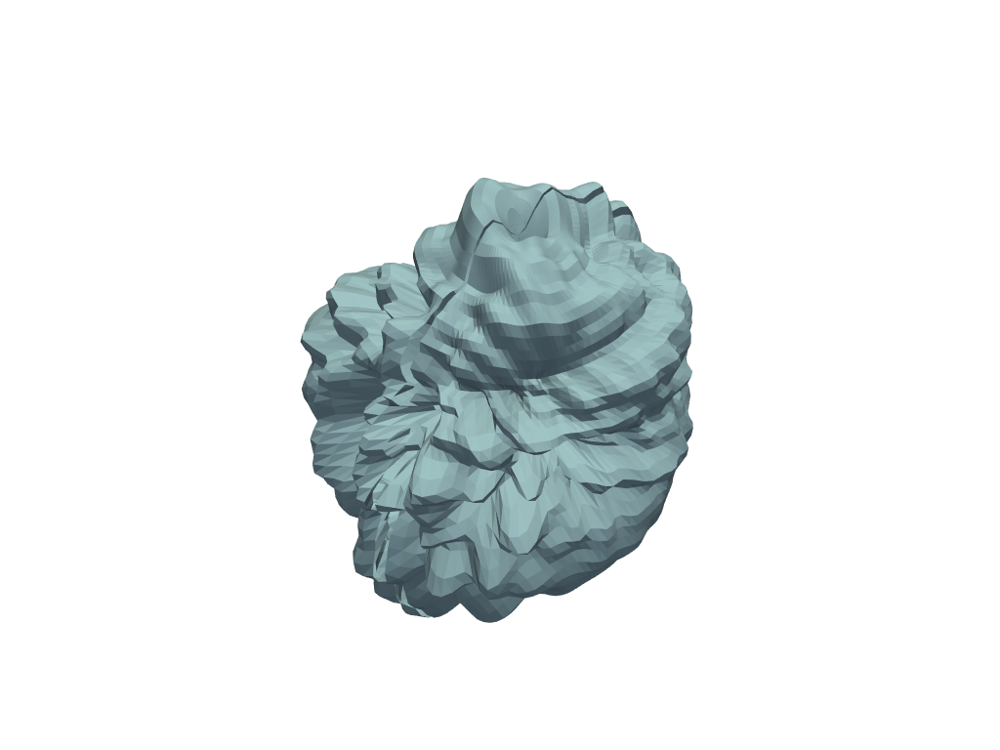

In [13]:
Ant = Antenna()
Ant.read("./Antenna Measurements/RM-WB1-DN-BLK Upside Down/RM-WB1-DN-BLK Upside Down-F3400.txt")
Ant.plot3d()
Ant.generateStl("AntennaTX3500")

/home/agrses/.local/lib/python3.12/site-packages/pyvista/jupyter/notebook.py:34: UserWarning:

Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/home/agrses/.local/lib/python3.12/site-packages/trame/widgets/__init__.py)

Falling back to a static output.



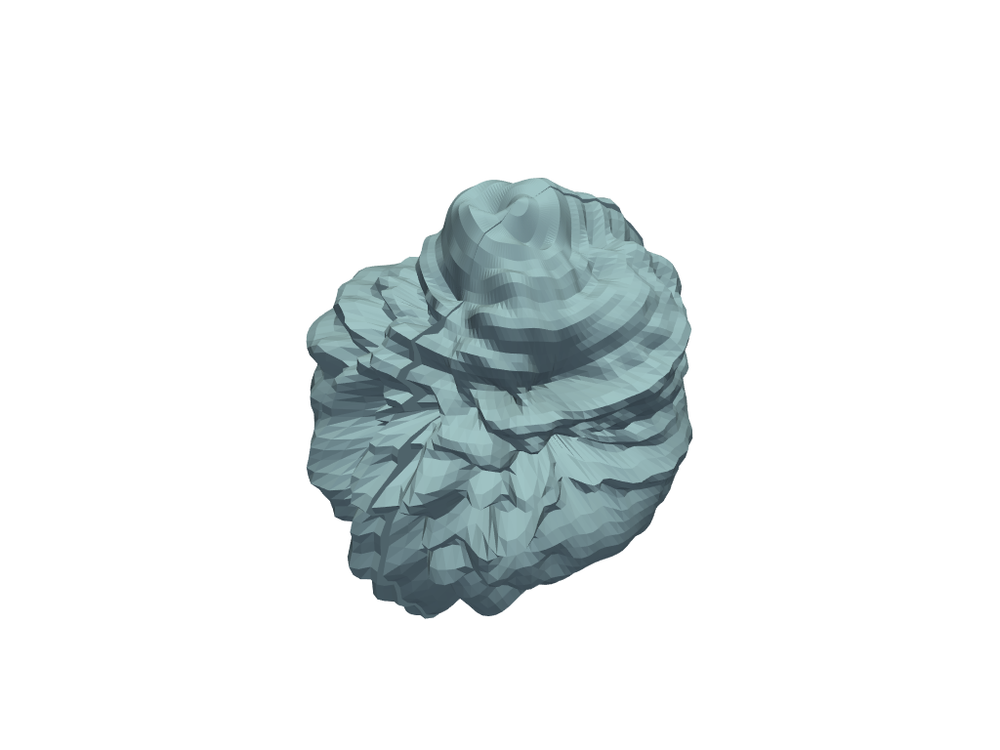

In [14]:
# For stl generation
Ant = Antenna()
Ant.read("./Antenna Measurements/RM-WB1-DN-BLK Upside Down/RM-WB1-DN-BLK Upside Down-F3500.txt")

cpy = Ant.df[Ant.df['phi'] == Ant.df['phi'].max()].copy()
cpy['phi'] = np.pi 
Ant.df = pd.concat([Ant.df, cpy])

cpy['phi'] = -np.pi
Ant.df = pd.concat([Ant.df, cpy])

Ant.plot3d()
Ant.generateStl("AntennaTX3500")

/home/agrses/.local/lib/python3.12/site-packages/pyvista/jupyter/notebook.py:34: UserWarning:

Failed to use notebook backend: 

cannot import name 'vtk' from 'trame.widgets' (/home/agrses/.local/lib/python3.12/site-packages/trame/widgets/__init__.py)

Falling back to a static output.



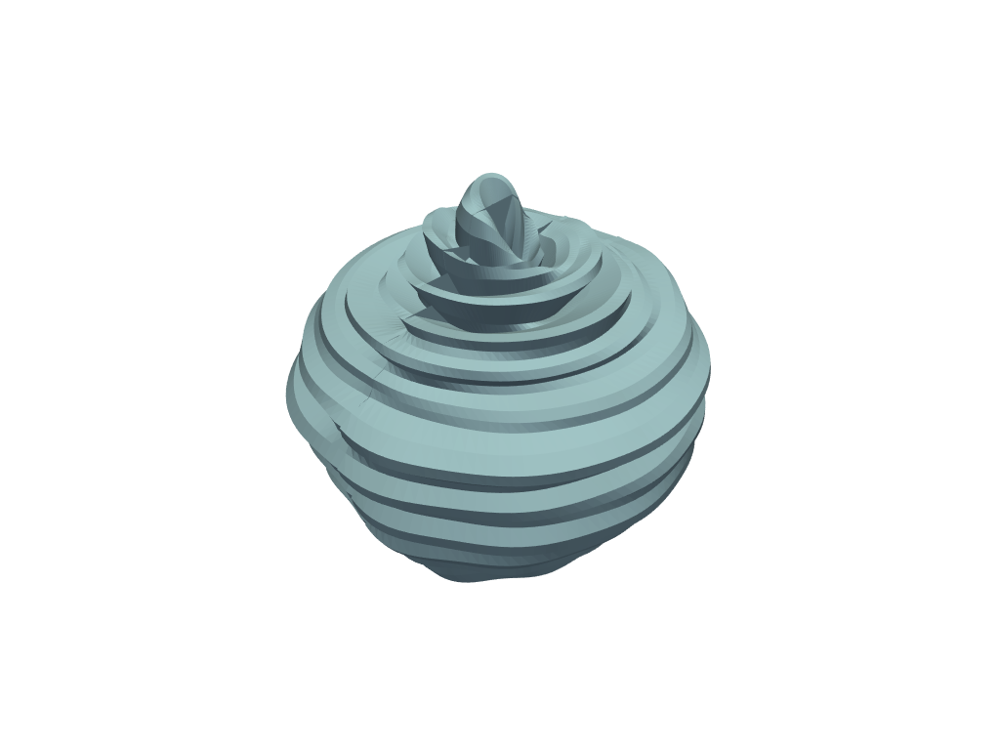

In [15]:
Ant = Antenna()
Ant.read("./Antenna Measurements/SA-1400-5900/SA-1400-5900-F1700.txt")

cpy = Ant.df[Ant.df['phi'] == Ant.df['phi'].max()].copy()
cpy['phi'] = np.pi 
Ant.df = pd.concat([Ant.df, cpy])

cpy['phi'] = -np.pi
Ant.df = pd.concat([Ant.df, cpy])

Ant.plot3d()
Ant.generateStl("AntennRX3500")

In [16]:
df = Ant.df
df["gain_total"] = df["gain_total_db"] 
df["phi"] = np.degrees(df["phi"])
df["theta"] = np.degrees(df["theta"])
df.to_csv("AntennaRX_3500MHz.csv", index=False)

In [17]:
from scipy.__config__ import show


FixedNode_str = "./Antenna Measurements/RM-WB1-DN-BLK Upside Down/RM-WB1-DN-BLK Upside Down-F"
PortableNode_str = "./Antenna Measurements/SA-1400-5900/SA-1400-5900-F"

freqs = [3300, 3400, 3500]


fig = make_subplots(
    rows=2, cols=3,
    vertical_spacing=0.05,
    specs=[[{'type': 'surface'}, {'type': 'surface'}, {'type': 'surface'}],
           [{'type': 'surface'}, {'type': 'surface'}, {'type': 'surface'}]],
    subplot_titles=("Frequency: 3300 MHz Fixed Node", "Frequency: 3400 MHz Fixed Node", "Frequency: 3500 MHz Fixed Node",
                    "Frequency: 3300 MHz Portable Node", "Frequency: 3400 MHz Portable Node", "Frequency: 3500 MHz Portable Node"),
)

def add_el_az(fig, row, col):
    fig.add_trace(go.Scatter3d(x=[25, 25], y=[25, 25], z=[0, 25],
                                mode='lines+text',
                                line=dict(color='red', width=4),
                                text=["elevation", ""],
                                textposition="top center"), row=row, col=col)
     
    fig.add_trace(go.Scatter3d(x=[25, 25], y=[0, 25], z=[25, 25],
                                mode='lines+text',
                                line=dict(color='red', width=4),
                                text=["azimuth", ""],
                                textposition="top center"), row=row, col=col)

for idx, fr in enumerate(freqs):
    AntennaFixed = Antenna()
    AntennaFixed.read(FixedNode_str + str(fr) + ".txt")
    x1, y1, z1, e_grid_1 = AntennaFixed.xyz_radiation()

    AntennaPortable = Antenna()
    AntennaPortable.read(PortableNode_str + str(fr) + ".txt")
    x2, y2, z2, e_grid_2 = AntennaPortable.xyz_radiation()

    show_clr = True if idx == 0 else False
    fig.add_trace(
        go.Surface(x=x1, y=y1, z=z1, surfacecolor=e_grid_1,
                   coloraxis="coloraxis1", showscale=True),
        row=1, col=idx+1)
    
    add_el_az(fig, 1, idx+1)

    fig.add_trace(
        go.Surface(x=x2, y=y2, z=z2, surfacecolor=e_grid_2,
                   coloraxis="coloraxis2", showscale=True),
        row=2, col=idx+1)
    
    add_el_az(fig, 2, idx+1)

# fig.update_layout(coloraxis=dict(colorscale='jet'))

camera = dict(
    up=dict(x=0, y=0, z=1),  # sets the upward direction
    center=dict(x=0, y=0, z=0),  # centers the plot
    # a viewpoint simulating an azimuth and elevation
    eye=dict(x=2, y=2, z=0.5)
)


fig.update_layout(
    title_text="Antenna Radiation Patterns",
    height=1500, width=1800,
    scene_camera=camera, 
    showlegend=False
)

# fig.update_layout(coloraxis_colorbar=dict(
#     title="Number of Bills per Cell",
#     thicknessmode="pixels", thickness=50,
#     lenmode="pixels", len=200,
#     yanchor="top", y=1,
#     ticks="outside", ticksuffix=" bills",
#     dtick=5
# ))

fig.update_layout(
    coloraxis1=dict(colorscale='jet', colorbar=dict(x=1.0, title='Fixed Node<br>Antenna Gain<br>(dB)')),
    coloraxis2=dict(colorscale='jet', colorbar=dict(x=1.06, title='Portable Node<br>Antenna Gain<br>(dB)'))
)
fig.update_scenes(xaxis_title_text='x',  
                  yaxis_title_text='y',  
                  zaxis_title_text='z')



fig.write_html("AntennaRadiationPatterns.html")
fig.show()